In [21]:
# Load libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
import folium
from folium.plugins import HeatMap

# Import data
data = pd.read_csv('crimes-in-boston/crime.csv', encoding='latin-1')
# Keep only data from complete years (2016, 2017)
data = data.loc[data['YEAR'].isin([2016,2017])]
# Remove unused columns
data = data.drop(['INCIDENT_NUMBER', 'Location'], axis=1)
# Convert OCCURED_ON_DATE to datetime
data['OCCURRED_ON_DATE'] = pd.to_datetime(data['OCCURRED_ON_DATE'])
# Fill in nans in SHOOTING column
data.SHOOTING.fillna('N', inplace=True)
# Convert DAY_OF_WEEK to an ordered category
data.DAY_OF_WEEK = pd.Categorical(data.DAY_OF_WEEK, 
              categories=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'],
              ordered=True)

# Replace -1 values in Lat/Long with Nan
data.Lat.replace(-1, None, inplace=True)
data.Long.replace(-1, None, inplace=True)

# Rename columns to something easier to type (the all-caps are annoying!)
rename = {'OFFENSE_CODE_GROUP':'Group',
         'OFFENSE_DESCRIPTION':'Description',
         'DISTRICT':'District',
         'REPORTING_AREA':'Area',
         'SHOOTING':'Shooting',
         'OCCURRED_ON_DATE':'Date',
         'YEAR':'Year',
         'MONTH':'Month',
         'DAY_OF_WEEK':'Day',
         'HOUR':'Hour',
         'STREET':'Street'}
data.rename(index=str, columns=rename, inplace=True)

# Peek
data.head(100)

,OFFENSE_CODE,Group,Description,District,Area,Shooting,Date,Year,Month,Day,Hour,UCR_PART,Street,Lat,Long
569,1107,Fraud,FRAUD - IMPERSONATION,D4,905,N,2017-11-01 00:00:00,2017,11,Wednesday,0,Part Two,E BROOKLINE ST,42.339268,-71.072088
744,3114,Investigate Property,INVESTIGATE PROPERTY,D14,793,N,2017-10-11 17:43:00,2017,10,Wednesday,17,Part Three,KELTON ST,42.346501,-71.136128
923,3201,Property Lost,PROPERTY - LOST,B2,287,N,2017-08-31 12:08:00,2017,8,Thursday,12,Part Three,SHAWMUT AVE,42.331925,-71.084112
1162,1102,Fraud,FRAUD - FALSE PRETENSE / SCHEME,D14,774,N,2017-06-27 07:00:00,2017,6,Tuesday,7,Part Two,COMMONWEALTH AVE,42.338482,-71.152890
1444,3201,Property Lost,PROPERTY - LOST,B3,420,N,2017-12-08 22:00:00,2017,12,Friday,22,Part Three,MORTON ST,42.279591,-71.081323
1813,1107,Fraud,FRAUD - IMPERSONATION,C11,384,N,2016-01-10 00:00:00,2016,1,Sunday,0,Part Two,HILL TOP ST,42.280498,-71.048885
1827,3201,Property Lost,PROPERTY - LOST,A7,942,N,2017-01-30 19:00:00,2017,1,Monday,19,Part Three,VALLAR RD,42.392697,-71.008424
1916,3114,Investigate Property,INVESTIGATE PROPERTY,D14,791,N,2017-11-10 16:30:00,2017,11,Friday,16,Part Three,CAROL AVE,42.344980,-71.140906
2302,2610,Other,TRESPASSING,C6,220,N,2017-09-01 08:00:00,2017,9,Friday,8,Part Two,E BROADWAY,42.335468,-71.044891
2974,1106,Confidence Games,FRAUD - CREDIT CARD / ATM FRAUD,C11,244,N,2017-10-11 00:00:00,2017,10,Wednesday,0,Part Two,E COTTAGE ST,42.318532,-71.057790


In [18]:
data.dtypes

OFFENSE_CODE                    int64
OFFENSE_CODE_GROUP             object
OFFENSE_DESCRIPTION            object
DISTRICT                       object
REPORTING_AREA                 object
SHOOTING                       object
OCCURRED_ON_DATE       datetime64[ns]
YEAR                            int64
MONTH                           int64
DAY_OF_WEEK                    object
HOUR                            int64
UCR_PART                       object
STREET                         object
Lat                           float64
Long                          float64
dtype: object

In [19]:
data.isnull().sum()

OFFENSE_CODE               0
OFFENSE_CODE_GROUP         0
OFFENSE_DESCRIPTION        0
DISTRICT                1093
REPORTING_AREA             0
SHOOTING                   0
OCCURRED_ON_DATE           0
YEAR                       0
MONTH                      0
DAY_OF_WEEK                0
HOUR                       0
UCR_PART                  73
STREET                  8446
Lat                    13597
Long                   13597
dtype: int64

In [20]:
#Check the size of dataset
data.shape

(200000, 15)

In [23]:
#Remove any rows with NaN
data = data.dropna()

(184638, 15)

In [63]:
#Check new size of dataset
data.shape

(174472, 16)

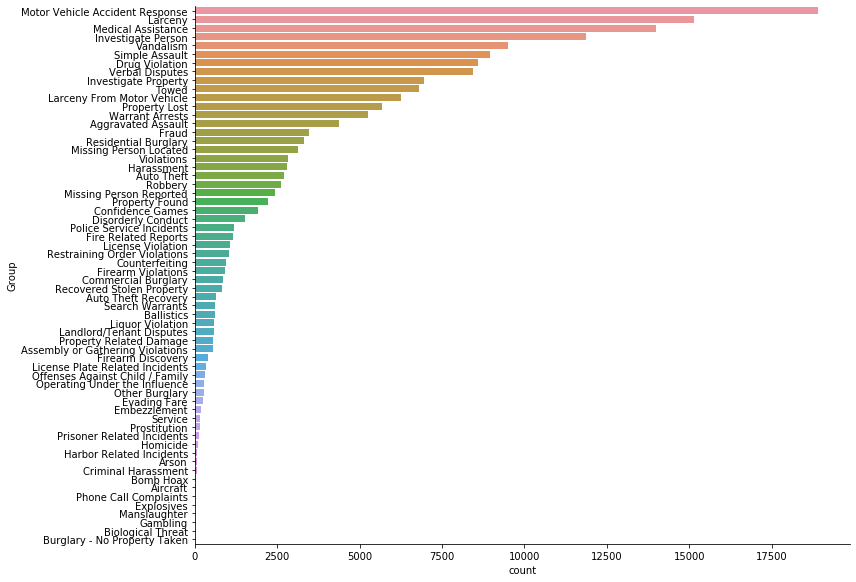

In [28]:
# Countplot for crime types without the crime group other, this is done because Other is not informative.
indexNames = data[data['Group'] == "Other" ].index
data_no_other = data.drop(indexNames)
sns.catplot(y='Group',
           kind='count',
            height=8, 
            aspect=1.5,
            order=data.Group.value_counts().index,
           data=data_no_other)

Text(-8.700000000000003, 0.5, 'Count')

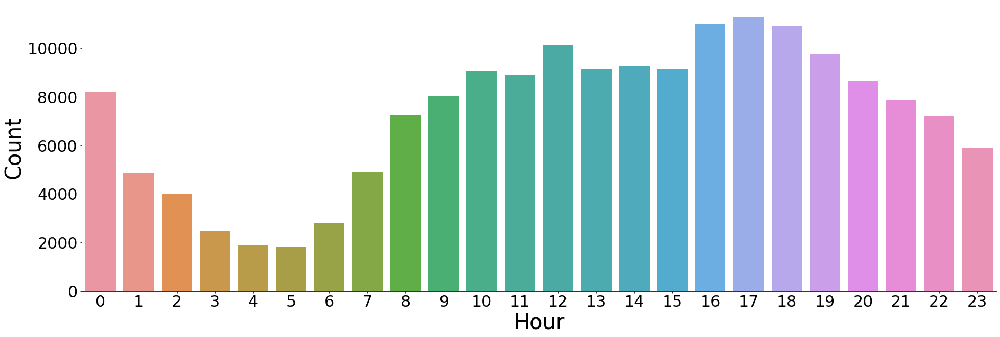

In [30]:
# Crimes by hour of the day
sns.catplot(x='Hour',
           kind='count',
            height=8.27, 
            aspect=3,
           data=data)
plt.xticks(size=30)
plt.yticks(size=30)
plt.xlabel('Hour', fontsize=40)
plt.ylabel('Count', fontsize=40)

Text(-8.824999999999996, 0.5, 'Count')

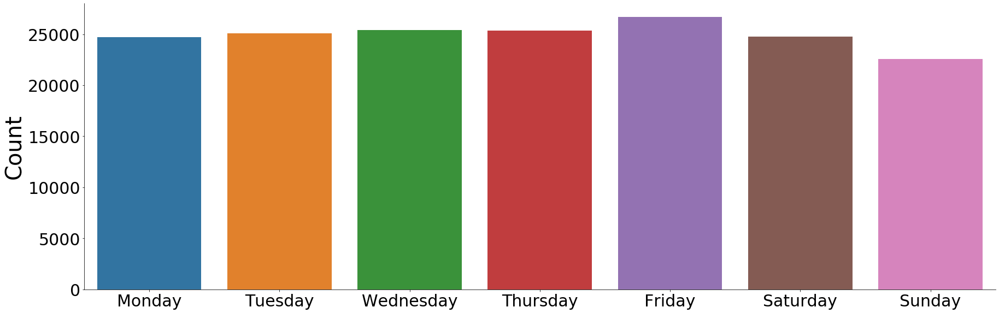

In [31]:
# Crimes by day of the week
sns.catplot(x='Day',
           kind='count',
            height=8, 
            aspect=3,
           data=data)
plt.xticks(size=30)
plt.yticks(size=30)
plt.xlabel('')
plt.ylabel('Count', fontsize=40)

Text(-8.824999999999996, 0.5, 'Count')

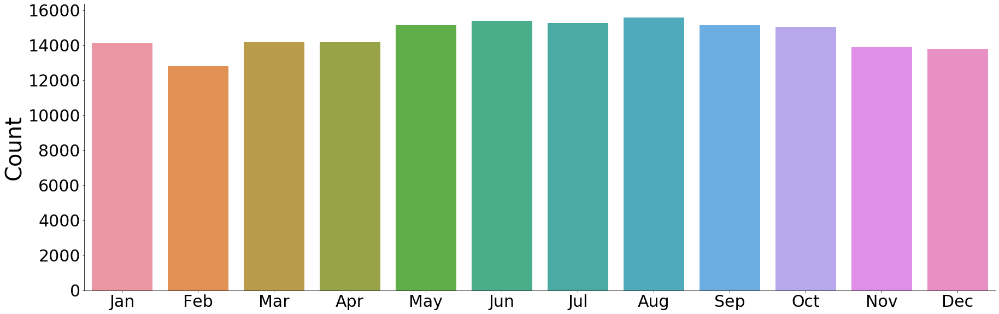

In [33]:
# Crimes by month of year
months = ['Jan','Feb','Mar','Apr','May','Jun','Jul','Aug','Sep','Oct','Nov','Dec']
sns.catplot(x='Month',
           kind='count',
            height=8, 
            aspect=3,
           data=data)
plt.xticks(np.arange(12), months, size=30)
plt.yticks(size=30)
plt.xlabel('')
plt.ylabel('Count', fontsize=40)

In [38]:
# Create data for plotting
# Number every incident by day, Jan 1 = 1, Dec 31 = 364 etc...
data['Day_of_year'] = data.Date.dt.dayofyear 
# Group incident using day number and count the occurence of each day
data_holidays = data[data.Year == 2017].groupby(['Day_of_year']).size().reset_index(name='counts') 

In [40]:
# Dates of major U.S. holidays in 2017
holidays = pd.Series(['2017-01-01', # New Years Day
                     '2017-01-16', # MLK Day
                     '2017-03-17', # St. Patrick's Day
                     '2017-04-17', # Boston marathon
                     '2017-05-29', # Memorial Day
                     '2017-07-04', # Independence Day
                     '2017-09-04', # Labor Day
                     '2017-10-10', # Veterans Day
                     '2017-11-23', # Thanksgiving
                     '2017-12-25']) # Christmas
holidays = pd.to_datetime(holidays).dt.dayofyear
holidays_names = ['NY',
                 'MLK',
                 'St Pats',
                 'Marathon',
                 'Mem',
                 'July 4',
                 'Labor',
                 'Vets',
                 'Thnx',
                 'Xmas']



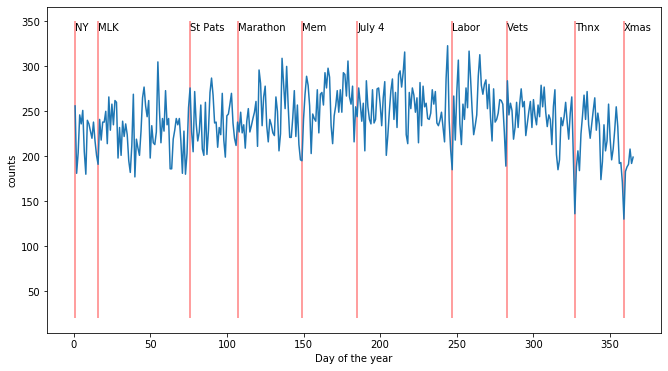

In [44]:
# Plot crimes and holidays
fig, ax = plt.subplots(figsize=(11,6))
sns.lineplot(x='Day_of_year',
            y='counts',
            ax=ax,
            data=data_holidays)
plt.xlabel('Day of the year')
plt.vlines(holidays, 20, 350, alpha=0.5, color ='r')
for i in range(len(holidays)):
    plt.text(x=holidays[i], y=340, s=holidays_names[i])

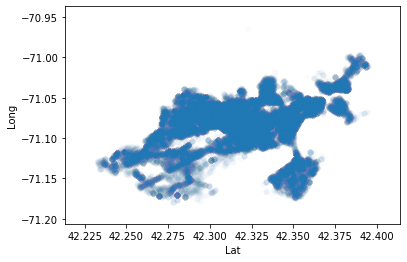

In [45]:
# Simple scatterplot
sns.scatterplot(x='Lat',
               y='Long',
                alpha=0.01,
               data=data)

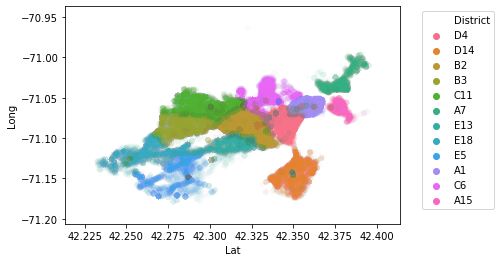

In [46]:
# Plot districts
sns.scatterplot(x='Lat',
               y='Long',
                hue='District',
                alpha=0.01,
               data=data)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2)

In [52]:
# Create basic Folium crime map
crime_map = folium.Map(location=[42.3125,-71.0875], 
                       tiles = "Stamen Toner",
                      zoom_start = 11)

# Add data for heatmp 
data_heatmap = data[data.Year == 2017]
data_heatmap = data[['Lat','Long']]
data_heatmap = data.dropna(axis=0, subset=['Lat','Long'])
data_heatmap = [[row['Lat'],row['Long']] for index, row in data_heatmap.iterrows()]
HeatMap(data_heatmap, radius=8).add_to(crime_map)

# Plot!
crime_map

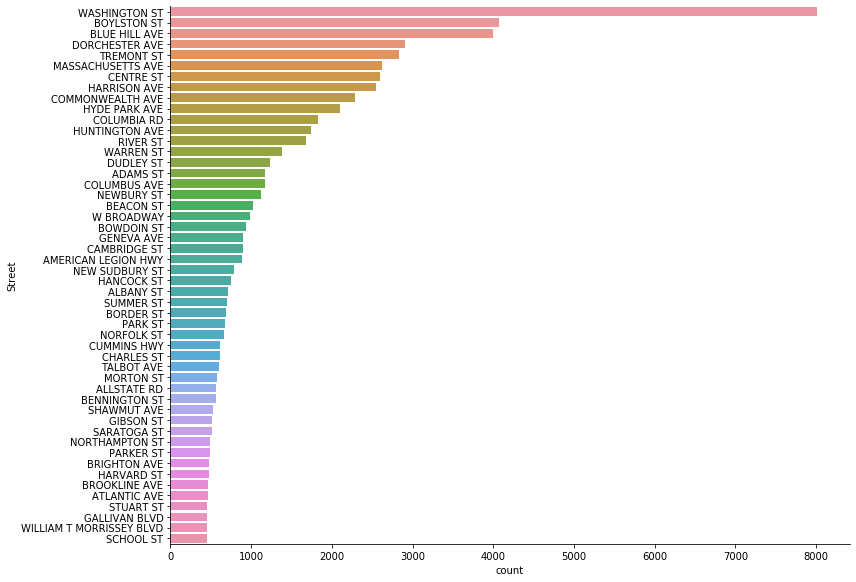

In [56]:
# Police response for top 50 streets
sns.catplot(y='Street',
           kind='count',
            height=8, 
            aspect=1.5,
            order=data.Street.value_counts().index[0:50],
           data=data)

In [71]:
# Create basic Folium crime map for shootings
crime_map_shooting = folium.Map(location=[42.3125,-71.0875], 
                       tiles = "Stamen Toner",
                      zoom_start = 11)

# Add data for heatmp 
data_heatmap = data[data.Shooting != "N"]
data_heatmap.shape
data_heatmap = data[['Lat','Long']]
data_heatmap = data.dropna(axis=0, subset=['Lat','Long'])
data_heatmap = [[row['Lat'],row['Long']] for index, row in data_heatmap.iterrows()]
HeatMap(data_heatmap, radius=7).add_to(crime_map_shooting)

# Plot!
crime_map_shooting

In [64]:
# See how many percent of responds involves shootings.
data.Shooting.describe()

count     174472
unique         2
top            N
freq      173856
Name: Shooting, dtype: object

In [65]:
# Calculate percentage of responses are shootings
perc_shooting = 173856/174472
perc_shooting

0.99646934751708